In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy import stats
import warnings                                  
warnings.filterwarnings('ignore')  

In [79]:
df = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [80]:
df.shape

(3998, 39)

In [81]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [82]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [83]:
df.dtypes

Unnamed: 0                       object
ID                                int64
Salary                            int64
DOJ                      datetime64[ns]
DOL                              object
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64


In [84]:
df.info

<bound method DataFrame.info of      Unnamed: 0      ID   Salary        DOJ                  DOL  \
0         train  203097   420000 2012-06-01              present   
1         train  579905   500000 2013-09-01              present   
2         train  810601   325000 2014-06-01              present   
3         train  267447  1100000 2011-07-01              present   
4         train  343523   200000 2014-03-01  2015-03-01 00:00:00   
...         ...     ...      ...        ...                  ...   
3993      train   47916   280000 2011-10-01  2012-10-01 00:00:00   
3994      train  752781   100000 2013-07-01  2013-07-01 00:00:00   
3995      train  355888   320000 2013-07-01              present   
3996      train  947111   200000 2014-07-01  2015-01-01 00:00:00   
3997      train  324966   400000 2013-02-01              present   

                      Designation           JobCity Gender        DOB  \
0         senior quality engineer         Bangalore      f 1990-02-19   
1    

In [85]:
Total = df.isnull().sum().sort_values(ascending=False)
Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])
missing_data

,Total,Percentage of Missing Values
Unnamed: 0,0,0.0
ComputerScience,0,0.0
GraduationYear,0,0.0
English,0,0.0
Logical,0,0.0
Quant,0,0.0
Domain,0,0.0
ComputerProgramming,0,0.0
ElectronicsAndSemicon,0,0.0
MechanicalEngg,0,0.0


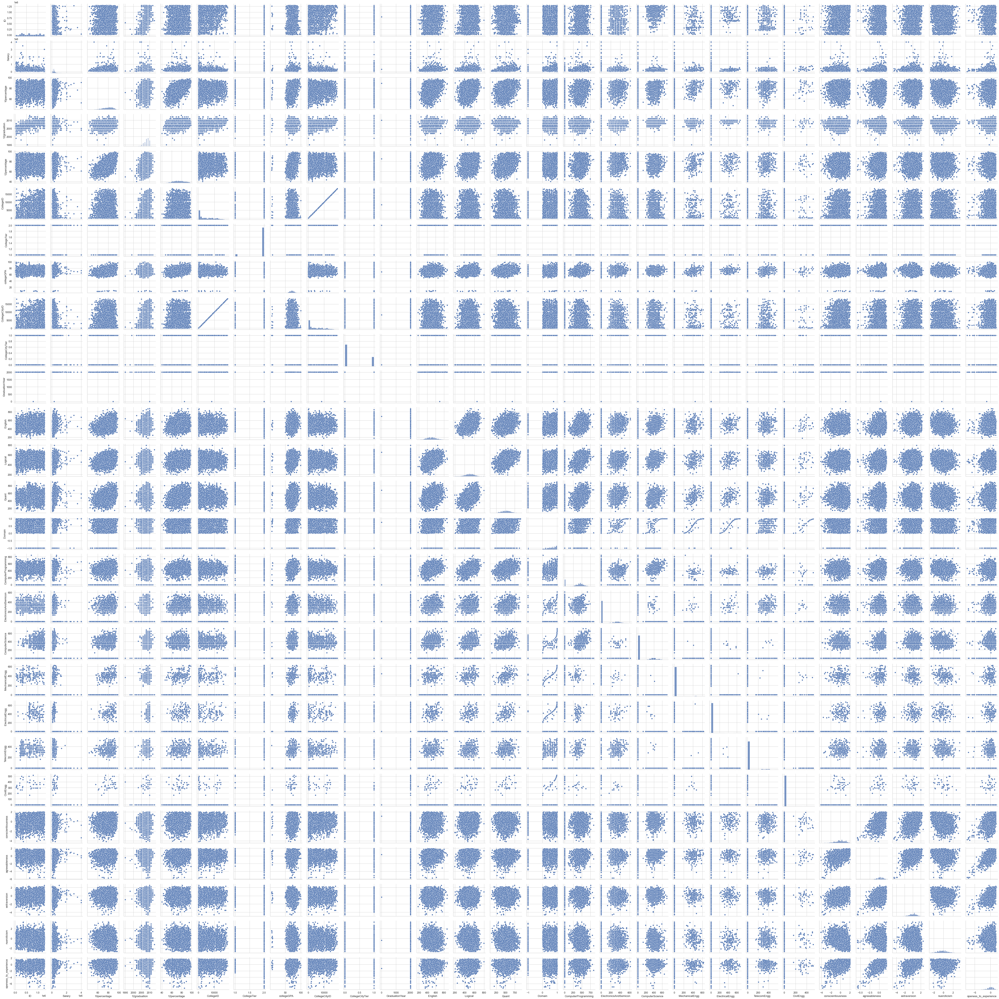

In [86]:
sns.pairplot(df)

<AxesSubplot:xlabel='10percentage'>

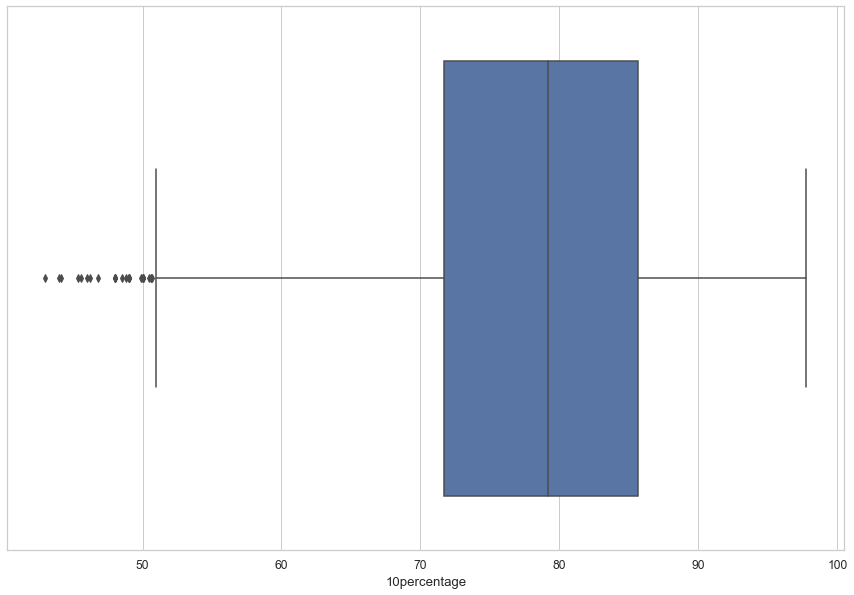

In [87]:
sns.boxplot(x=df['10percentage'])

<AxesSubplot:xlabel='Salary'>

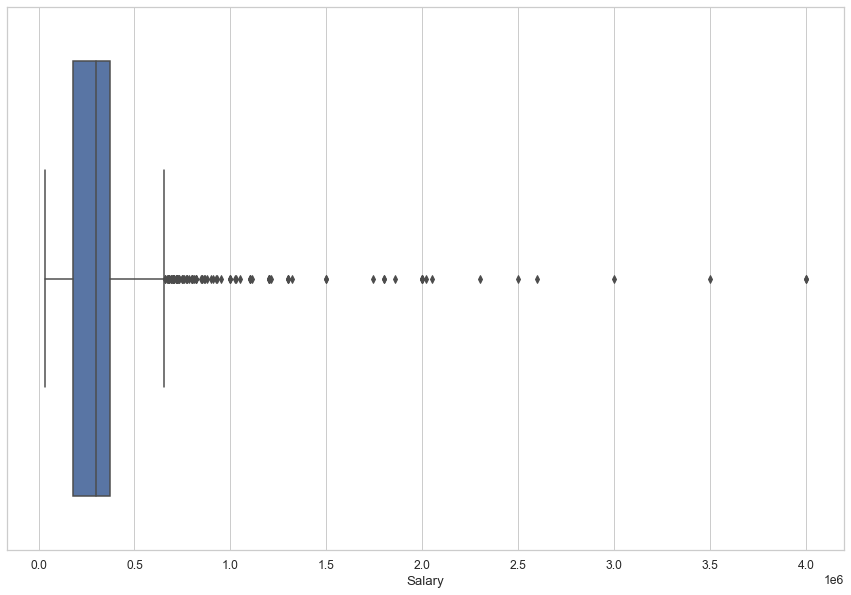

In [88]:
sns.boxplot(x=df['Salary'])

<AxesSubplot:xlabel='collegeGPA'>

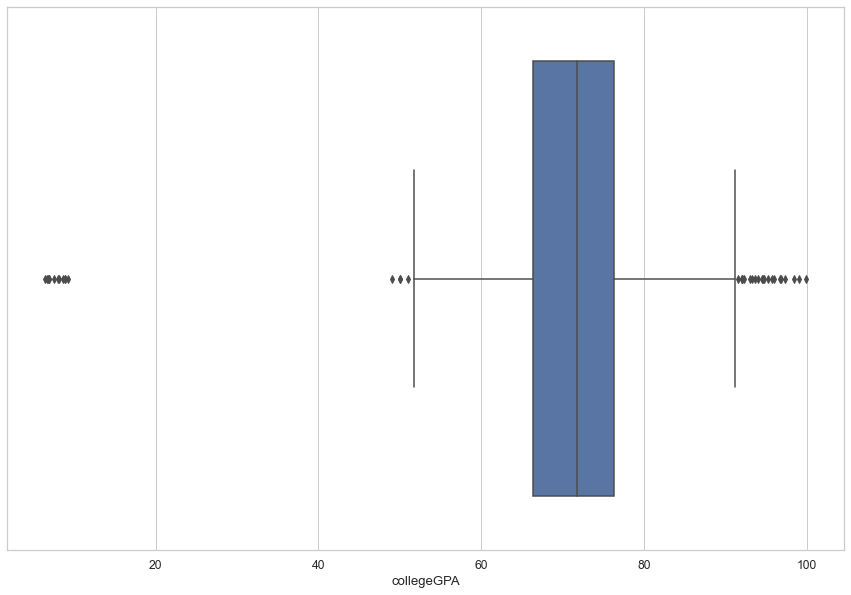

In [89]:
sns.boxplot(x=df['collegeGPA'])

<AxesSubplot:xlabel='12graduation', ylabel='Salary'>

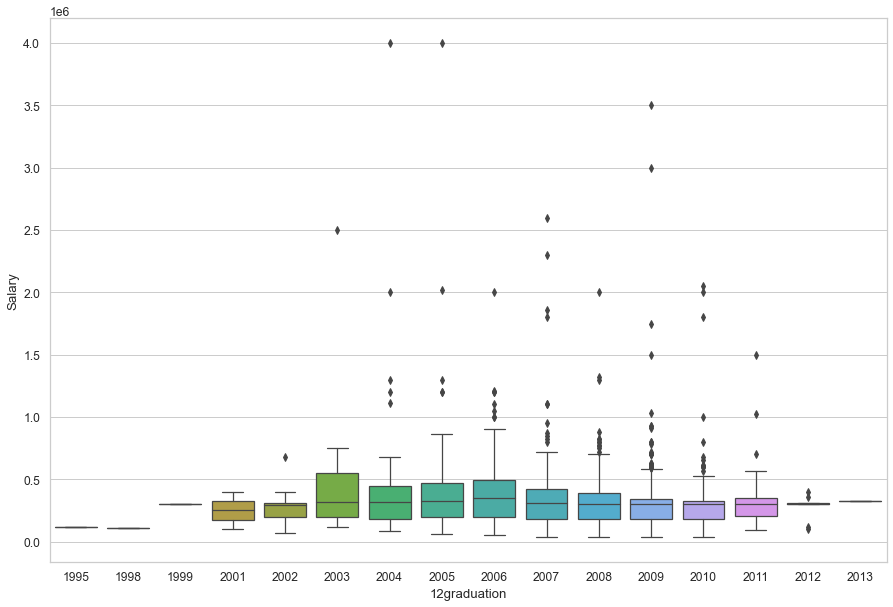

In [90]:
sns.boxplot(x=df["12graduation"],y=df["Salary"],width=0.8,linewidth=1.25)

array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'Salary'}>,
        <AxesSubplot:title={'center':'DOJ'}>,
        <AxesSubplot:title={'center':'DOB'}>,
        <AxesSubplot:title={'center':'10percentage'}>],
       [<AxesSubplot:title={'center':'12graduation'}>,
        <AxesSubplot:title={'center':'12percentage'}>,
        <AxesSubplot:title={'center':'CollegeID'}>,
        <AxesSubplot:title={'center':'CollegeTier'}>,
        <AxesSubplot:title={'center':'collegeGPA'}>],
       [<AxesSubplot:title={'center':'CollegeCityID'}>,
        <AxesSubplot:title={'center':'CollegeCityTier'}>,
        <AxesSubplot:title={'center':'GraduationYear'}>,
        <AxesSubplot:title={'center':'English'}>,
        <AxesSubplot:title={'center':'Logical'}>],
       [<AxesSubplot:title={'center':'Quant'}>,
        <AxesSubplot:title={'center':'Domain'}>,
        <AxesSubplot:title={'center':'ComputerProgramming'}>,
        <AxesSubplot:title={'center':'ElectronicsAndSemic

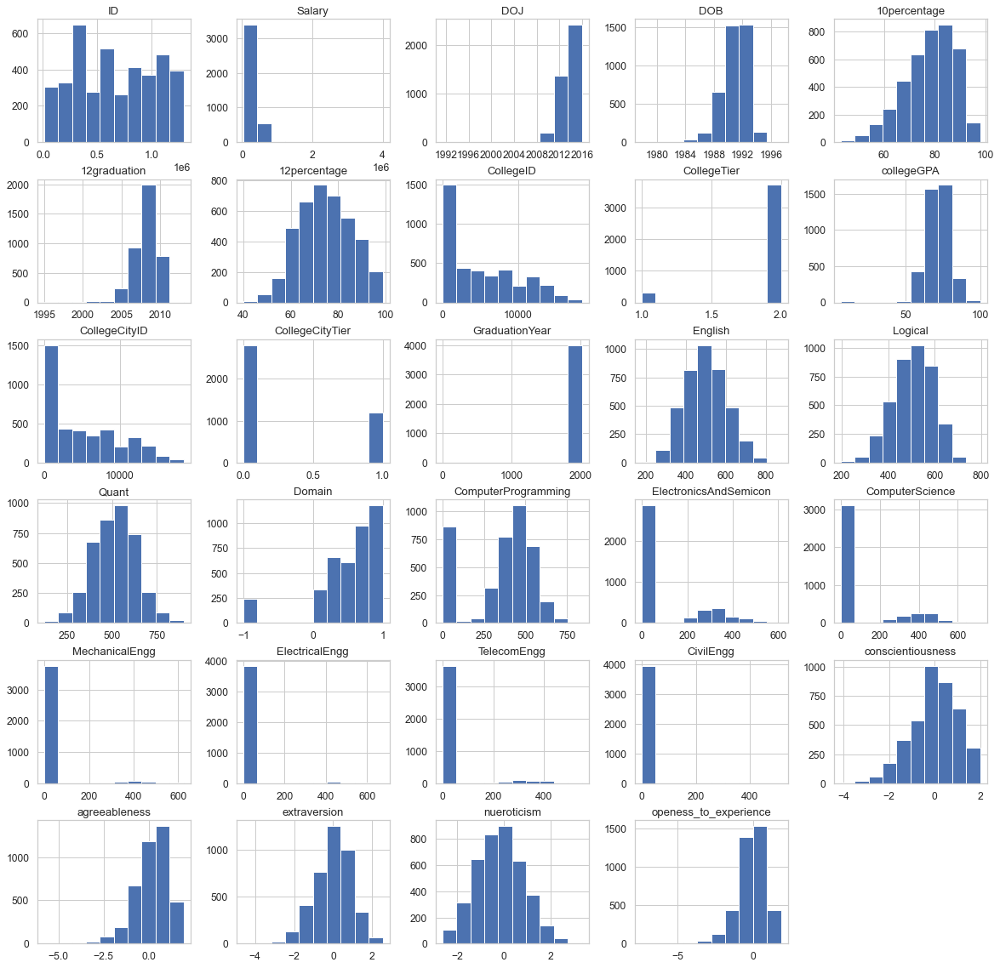

In [91]:
df.hist(figsize=(20,20))

In [92]:
categorical=['Designation','JobCity','Gender','CollegeTier','Degree','Specialization',
             'CollegeCityTier','CollegeState']

numerical=['Salary','10percentage','10board','12percentage','CollegeGPA','English',
           'Logical','Quant','Domain','ComputerProgramming','ElectronicsAndSemicon',
           'ComputerScience','MechanicalEngg','ElectricalEngg','TelecomEngg','CivilEngg',
           'conscientiousness','agreeableness','extraversion','neuroticism',
           'openess_to_experience']

[Text(0.5, 0, '12')]

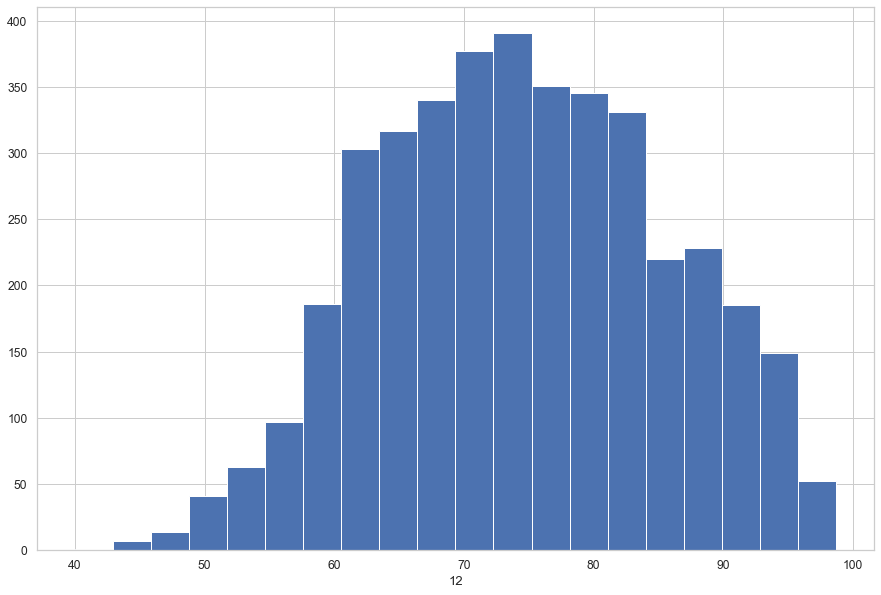

In [93]:
import seaborn as sns
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [15, 10]})
sns.distplot(df['12percentage'], norm_hist=False, kde=False, bins=20, hist_kws={"alpha": 1}).set(xlabel='12') 

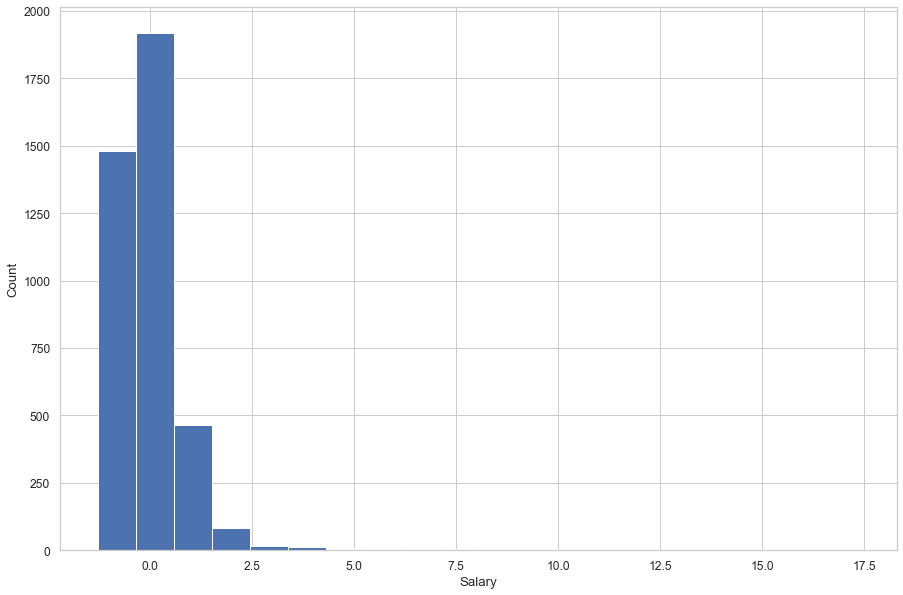

In [111]:
import seaborn as sns
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [15, 10]})
sns.distplot(df['Salary'], norm_hist=False, kde=False, bins=20, hist_kws={"alpha": 1}).set(xlabel='Salary', ylabel='Count');

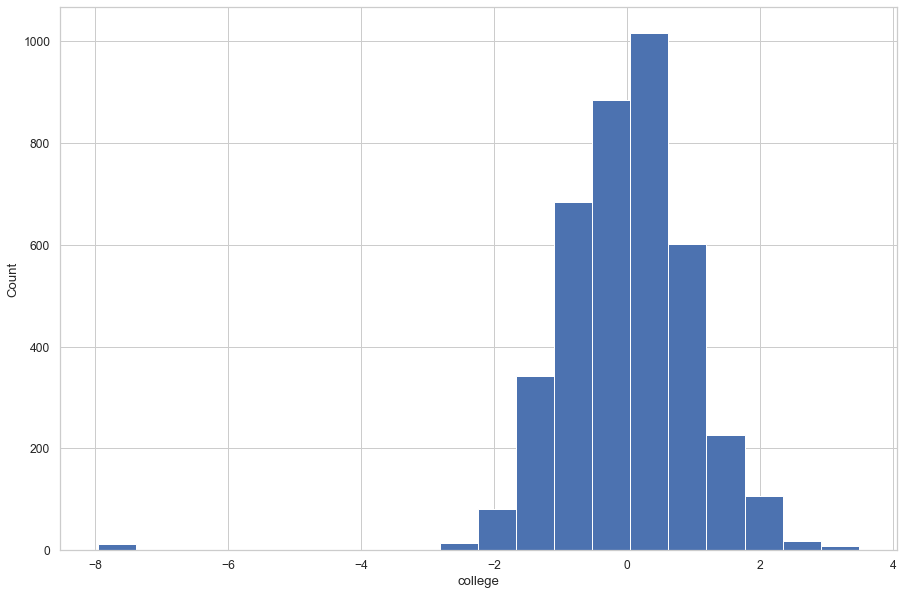

In [110]:
import seaborn as sns
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [15,10]})
sns.distplot(df['collegeGPA'], norm_hist=False, kde=False, bins=20, hist_kws={"alpha": 1}).set(xlabel='college',ylabel='Count'); 

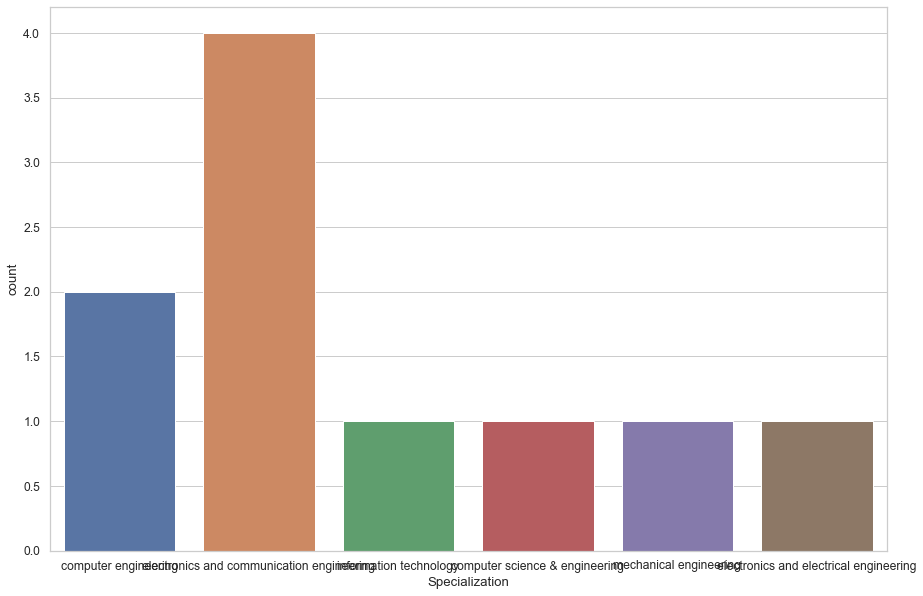

In [97]:
data=df[:10]
sns.countplot(data['Specialization']);

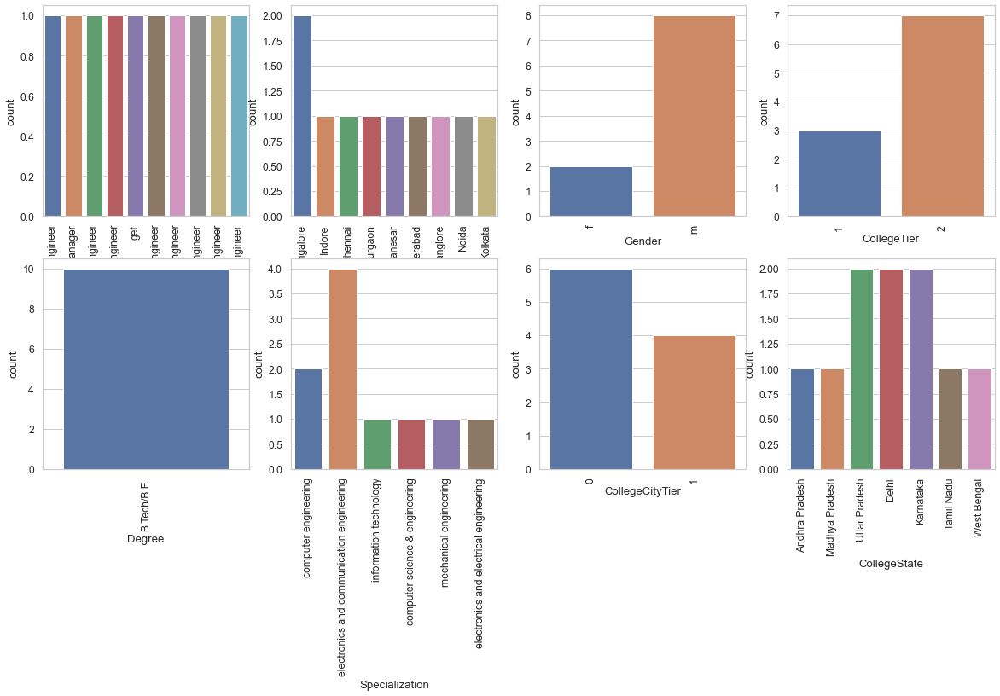

In [98]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10))
for variable, subplot in zip(categorical, ax.flatten()):
    sns.countplot(data[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)


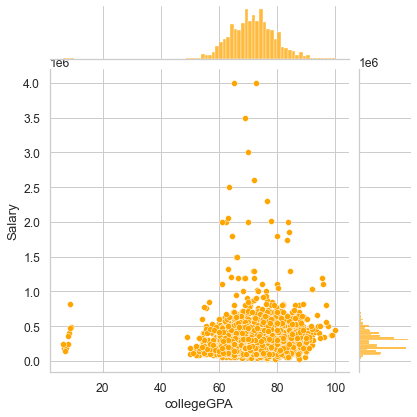

In [99]:
sns.jointplot(x=df['collegeGPA'], y=df['Salary'],color="orange")

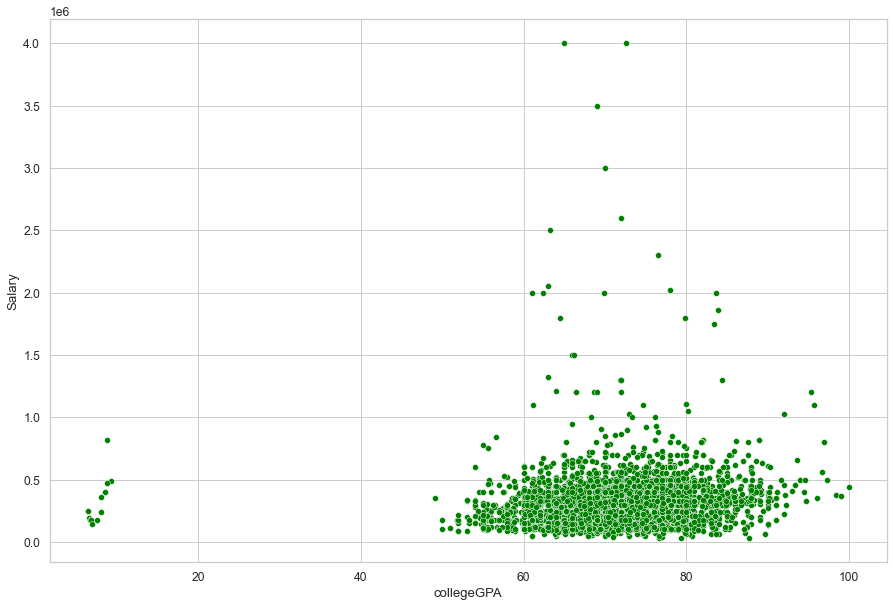

In [100]:
sns.scatterplot(x=df['collegeGPA'], y=df['Salary'],color="green");

<AxesSubplot:xlabel='Specialization', ylabel='Salary'>

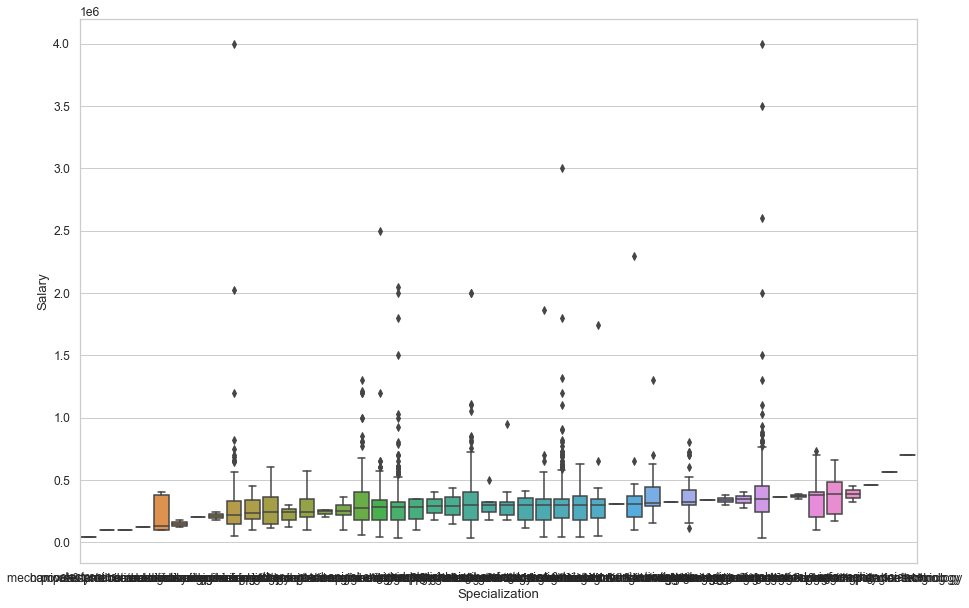

In [101]:
sorted_nb = df.groupby(['Specialization'])['Salary'].median().sort_values()
sns.boxplot(x=df['Specialization'], y=df['Salary'], order=list(sorted_nb.index))

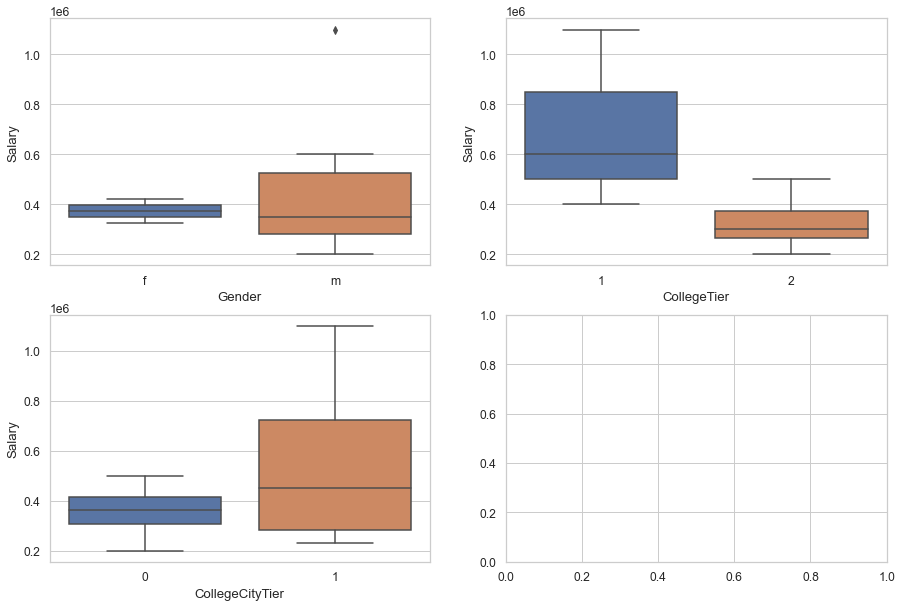

In [102]:
df1=df[:10]
cat=['Gender','CollegeTier','CollegeCityTier']
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
for var, subplot in zip(cat, ax.flatten()):
    sns.boxplot(x=var, y='Salary', data=df1, ax=subplot)

In [103]:
R=pd.crosstab(index=df['Specialization'],columns=df['Gender'])
print(R)

Gender                                         f    m
Specialization                                       
aeronautical engineering                       1    2
applied electronics and instrumentation        2    7
automobile/automotive engineering              0    5
biomedical engineering                         2    0
biotechnology                                  9    6
ceramic engineering                            0    1
chemical engineering                           1    8
civil engineering                              6   23
computer and communication engineering         0    1
computer application                          59  185
computer engineering                         175  425
computer networking                            0    1
computer science                               1    1
computer science & engineering               183  561
computer science and technology                2    4
control and instrumentation engineering        0    1
electrical and power enginee

In [104]:
# Chi-sq test
from scipy.stats import chi2_contingency
CSResult = chi2_contingency(R)
print('P-Value of the ChiSq Test:', CSResult[1])

P-Value of the ChiSq Test: 1.2453868176977011e-06


In [105]:
from sklearn.preprocessing import StandardScaler
df[['Salary','collegeGPA']]=StandardScaler().fit_transform(df[['Salary','collegeGPA']])
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,0.527947,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,0.904045,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,0.081332,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,3.724775,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,-0.506320,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,-0.130223,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,-0.976442,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,0.057826,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,-0.506320,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [106]:
designation=np.unique(df['Designation'])
designation

array(['.net developer', '.net web developer', 'account executive',
       'account manager', 'admin assistant', 'administrative coordinator',
       'administrative support', 'aircraft technician',
       'android developer', 'application developer',
       'application engineer', 'apprentice', 'ase', 'asp.net developer',
       'assistant administrator', 'assistant electrical engineer',
       'assistant engineer', 'assistant manager', 'assistant professor',
       'assistant programmer', 'assistant software engineer',
       'assistant store manager', 'assistant system engineer',
       'assistant system engineer - trainee',
       'assistant system engineer trainee', 'assistant systems engineer',
       'associate developer', 'associate engineer', 'associate manager',
       'associate qa', 'associate software developer',
       'associate software engg', 'associate software engineer',
       'associate system engineer', 'associate technical operations',
       'associate test engi

In [107]:
from sklearn.preprocessing import LabelEncoder
gle = LabelEncoder()
des_labels = gle.fit_transform(df['Designation'])
des_mappings = {index: label for index, label in 
                  enumerate(gle.classes_)}
des_mappings

{0: '.net developer',
 1: '.net web developer',
 2: 'account executive',
 3: 'account manager',
 4: 'admin assistant',
 5: 'administrative coordinator',
 6: 'administrative support',
 7: 'aircraft technician',
 8: 'android developer',
 9: 'application developer',
 10: 'application engineer',
 11: 'apprentice',
 12: 'ase',
 13: 'asp.net developer',
 14: 'assistant administrator',
 15: 'assistant electrical engineer',
 16: 'assistant engineer',
 17: 'assistant manager',
 18: 'assistant professor',
 19: 'assistant programmer',
 20: 'assistant software engineer',
 21: 'assistant store manager',
 22: 'assistant system engineer',
 23: 'assistant system engineer - trainee',
 24: 'assistant system engineer trainee',
 25: 'assistant systems engineer',
 26: 'associate developer',
 27: 'associate engineer',
 28: 'associate manager',
 29: 'associate qa',
 30: 'associate software developer',
 31: 'associate software engg',
 32: 'associate software engineer',
 33: 'associate system engineer',
 34: '

In [108]:
df['des_labels']=des_labels
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,des_labels
0,train,203097,0.527947,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,...,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,317
1,train,579905,0.904045,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,...,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,17
2,train,810601,0.081332,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,...,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,377
3,train,267447,3.724775,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,...,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,322
4,train,343523,-0.506320,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,...,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,-0.130223,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,...,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194,347
3994,train,752781,-0.976442,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,...,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943,391
3995,train,355888,0.057826,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,...,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,32
3996,train,947111,-0.506320,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,...,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943,342
